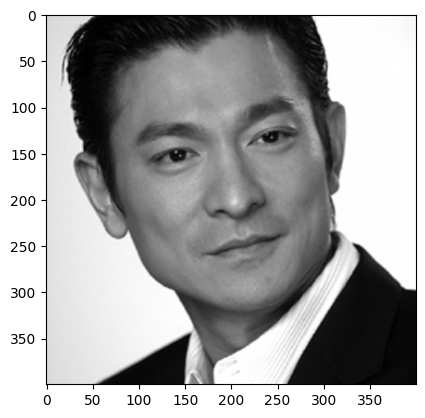

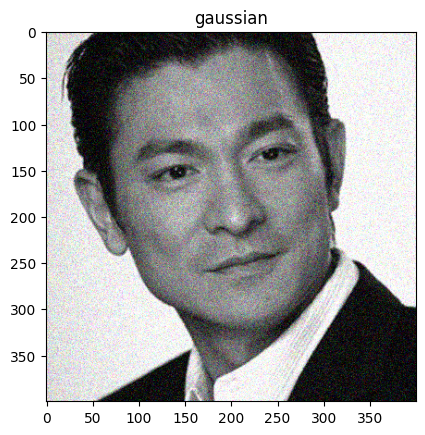

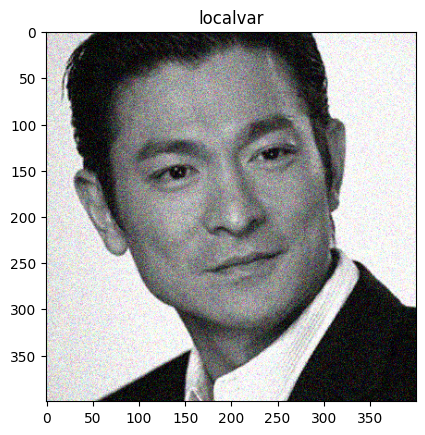

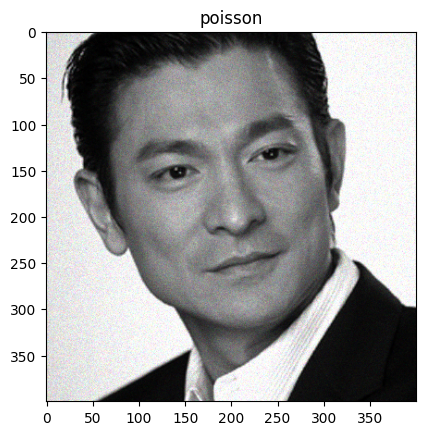

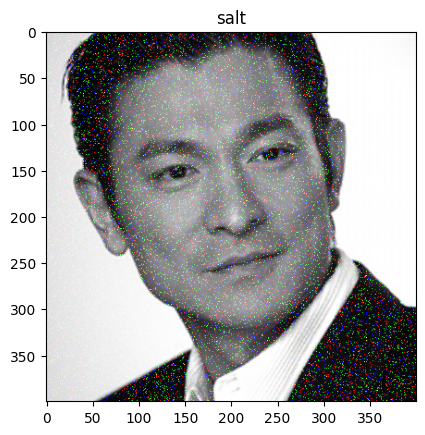

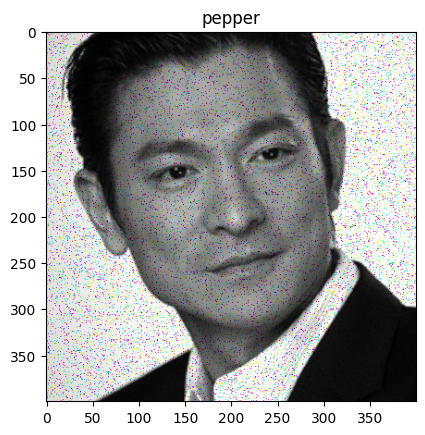

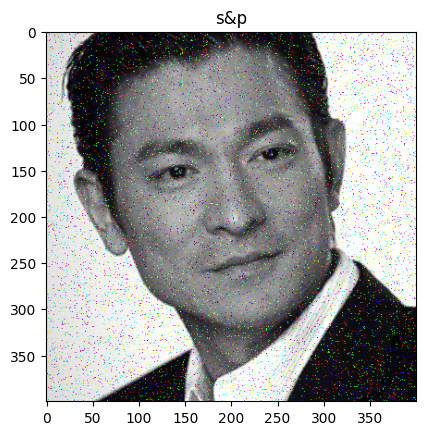

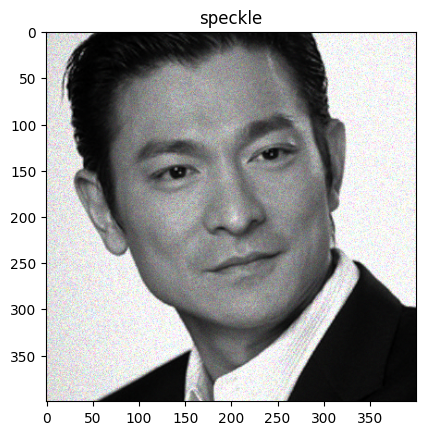

In [1]:
import matplotlib.pyplot as plt
from skimage.util import random_noise

andy = plt.imread('andy.jpg')
plt.imshow(andy)
plt.show()

modes = ['gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', 'speckle' ]

for m in modes:
    andy_noise = random_noise(andy, mode = m)
    plt.title(m)
    plt.imshow(andy_noise)
    plt.show()

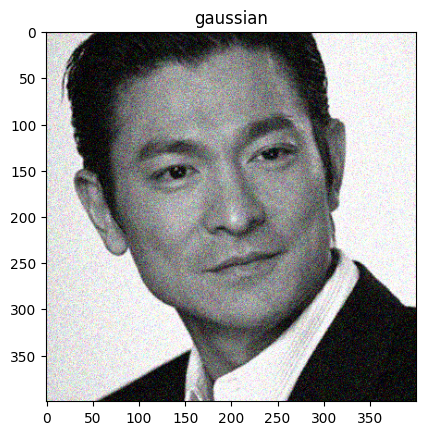

In [2]:
andy_noisy = random_noise(andy, mode = modes[0])
plt.title(modes[0])
plt.imshow(andy_noisy)
plt.show()

### Denoise_tv_chambolle

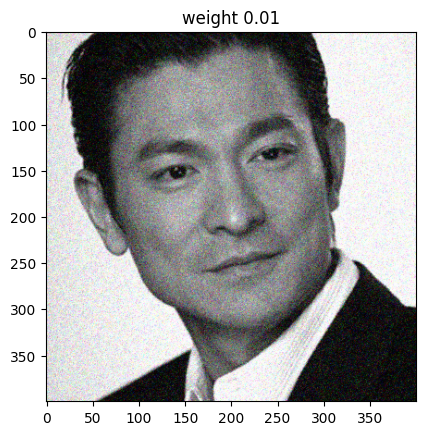

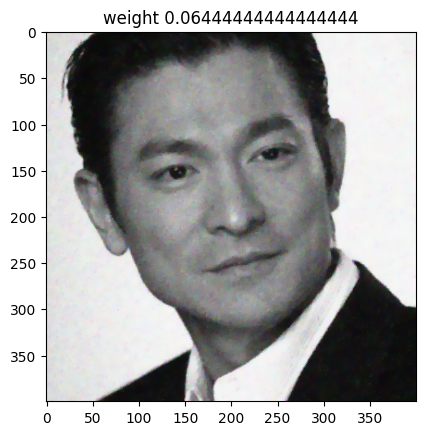

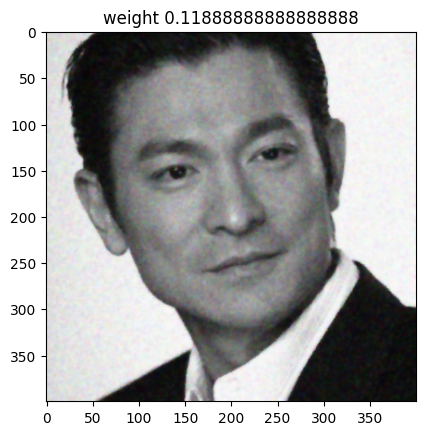

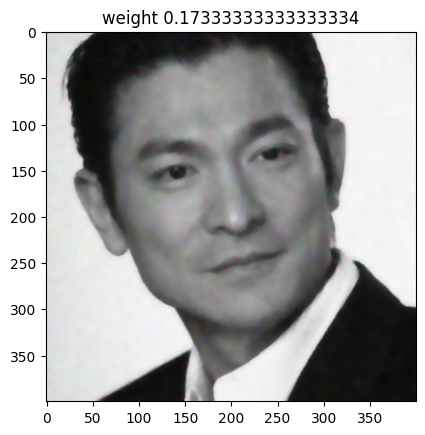

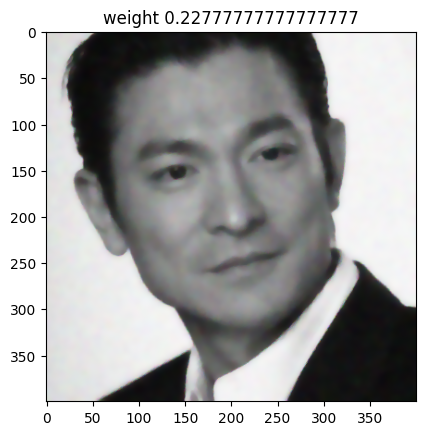

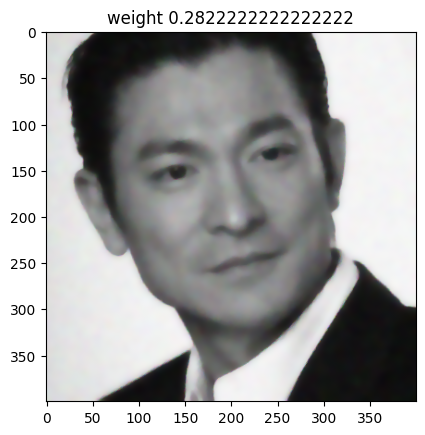

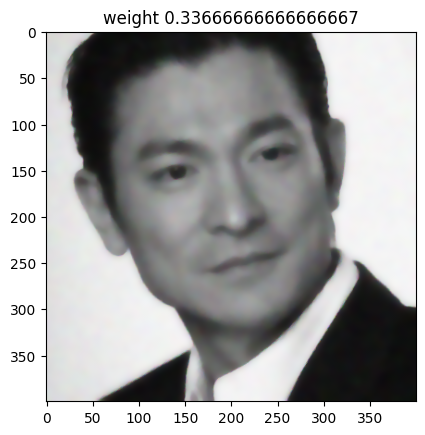

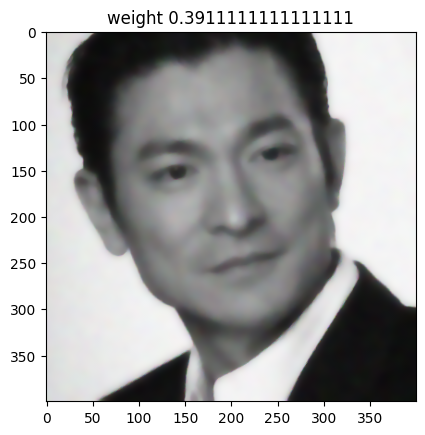

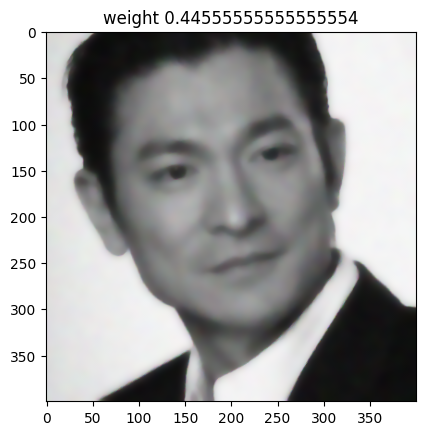

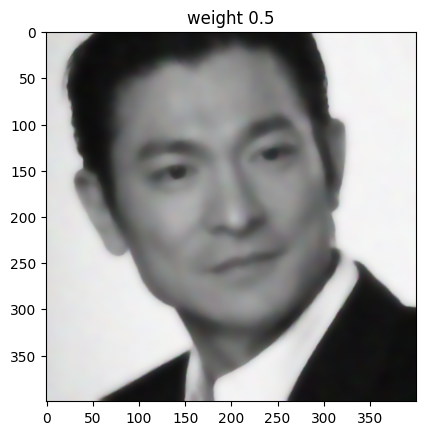

In [3]:
from skimage.restoration import denoise_tv_chambolle
import numpy as np

# 權重越大越模糊
for w in np.linspace(0.01, 0.5, 10):
    denoise_andy = denoise_tv_chambolle(andy_noisy,  weight = w, channel_axis = -1)
    plt.title('weight '+ str(w))
    plt.imshow(denoise_andy)
    plt.show()

### Denoise_bilateral

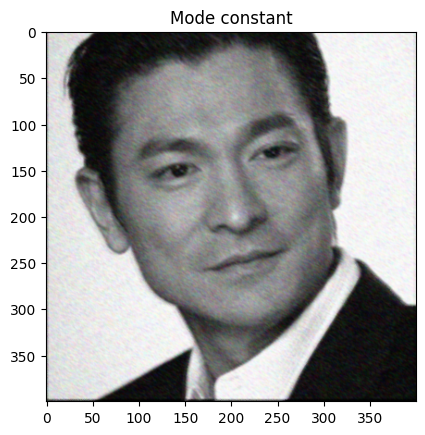

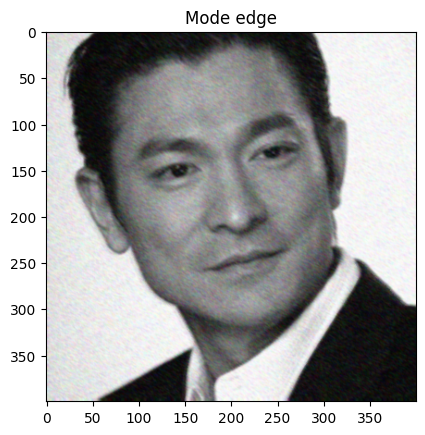

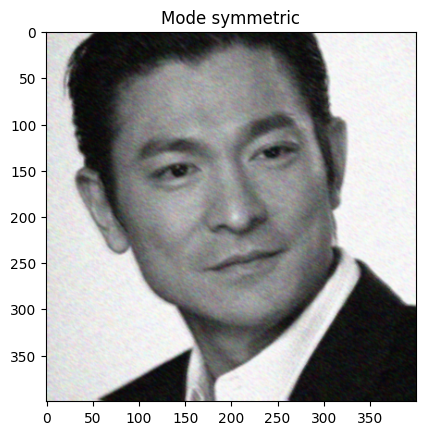

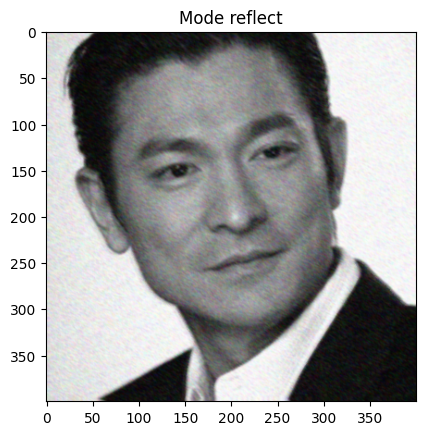

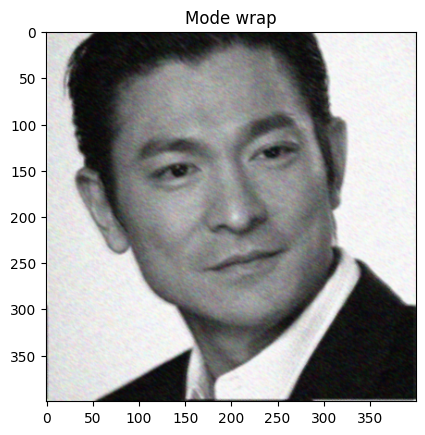

In [4]:
from skimage.restoration import denoise_bilateral
import numpy as np
modes = ['constant', 'edge', 'symmetric', 'reflect', 'wrap']
for m in modes:
    denoise_andy = denoise_bilateral(andy_noisy, mode = m, channel_axis = -1)
    plt.title('Mode ' + m)
    plt.imshow(denoise_andy)
    plt.show()

In [11]:
# Import the util module and the random noise function.
# Add noise to the image.
# Show the original and resulting image.

%matplotlib inline
import matplotlib.pyplot as plt

def show_image(image, title = 'Image', cmap_type = 'gray', interpolation = None):
    plt.imshow(image, cmap = cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()
    
def plot_comparision(original, filtered, title_filtered):
    fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (16, 16), sharex = True, sharey = True)
    ax1.imshow(original, cmap = plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    
    ax2.imshow(filtered, cmap = plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis('off')
    
import ast
import numpy as np
import matplotlib.pyplot as plt

with open('fruit_image.txt') as f:
    fruit_image = np.array(ast.literal_eval(f.read()), dtype = 'uint8')

fruit_image.shape

(417, 417, 3)

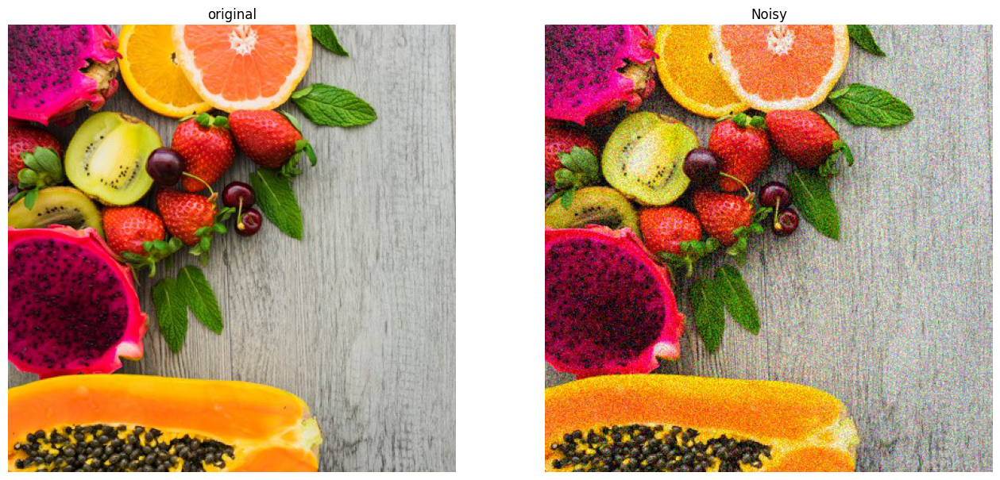

In [14]:
# Import the module and function
from skimage.util import random_noise

# Add noise to the image
noisy_image = random_noise(fruit_image)

# Show original and resulting image
# show_image(fruit_image, 'Original')
# show_image(noisy_image, 'Noisy image')
plot_comparision(fruit_image, noisy_image, 'Noisy')

In [16]:
from skimage.util import random_noise
noisy_image = random_noise(plt.imread('Noisy miny.png'))
noisy_image.shape

(344, 533, 3)

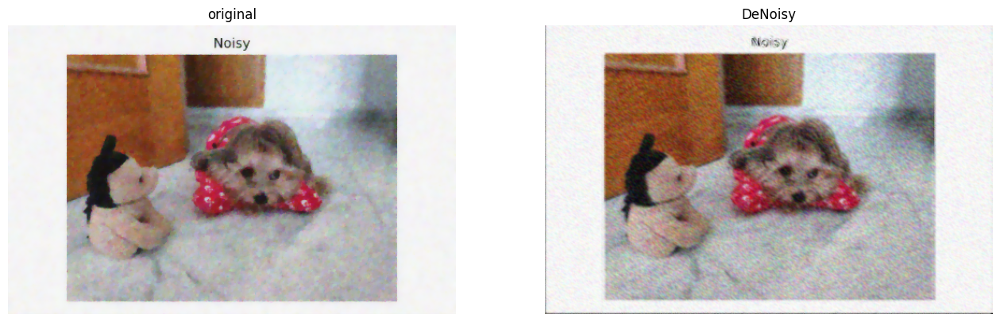

In [17]:
# Import the module and function
from skimage.restoration import denoise_tv_chambolle, denoise_bilateral

# Apply total variation filter denoising
denoised_image_1 = denoise_tv_chambolle(noisy_image, 
                                        channel_axis = -1)
denoised_image_2 = denoise_bilateral(noisy_image, 
                                     channel_axis = -1)
# Show the noisy and denoised images
# show_image(noisy_image, 'Noisy')
# show_image(denoised_image, 'Denoised image')
plot_comparision(denoised_image_1, denoised_image_2, 'DeNoisy')

In [18]:
# Import the denoise_bilateral function from its module.
# Apply bilateral filter denoising.
# Show the original noisy and the resulting denoised image.

landscape_image = plt.imread('noise-noisy-nature.jpg')
landscape_image.shape

(1216, 1824, 3)

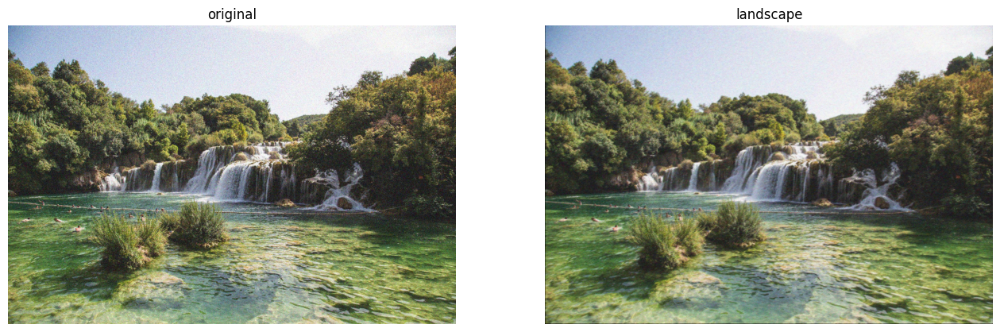

In [19]:
# Import bilateral denoising function
from skimage.restoration import denoise_bilateral

# Apply bilateral filter denoising
denoised_image = denoise_bilateral(landscape_image, 
                                   channel_axis = -1)

# Show original and resulting images
# show_image(landscape_image, 'Noisy image')
# show_image(denoised_image, 'Denoised image')
plot_comparision(landscape_image, denoised_image, 'landscape')